# Train Similarity Search Algorithm

This notebook trains a model on the previously extracted image features which will search for the most similar image



In [1]:
import os
import pandas as pd
import numpy as np
import csv
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
from joblib import dump, load

In [2]:
import utils

In [3]:
def load_features(fname='features_202010121706.csv'):

    fldr_path = os.path.join('..', 'data','processed')
    fpath = os.path.join(fldr_path, fname)

    with open(fpath,'r') as dest_f:
        data_reader = csv.reader(dest_f,
                               delimiter = ',')
        next(data_reader) #skips the header/first line
        data = [data for data in data_reader]

    data_array = np.asarray(data, dtype=np.float32)
    labels = data_array[:,0].astype(int)
    features_list = data_array[:,1:].tolist()

    return labels, features_list 

In [4]:
def load_metadata():
    # load metadata file
    fldr_path = os.path.join('..', 'data','interim')
    fname = 'graphik_portal_202010121646.csv'
    fpath = os.path.join(fldr_path, fname)

    df = pd.read_csv(fpath, index_col=0)
    
    return df

In [5]:
def get_feature_extractor_notes(features_serial_num):
    
    fname = 'features_notes_{}.txt'.format(features_serial_num)
    fldr_path = os.path.join('..', 'data','processed')
    fpath = os.path.join(fldr_path, fname)

    with open(fpath,'r') as f:
        features_notes = f.readlines()
    
    return features_notes

In [6]:
def save_model_notes(clf, model_fldr=None):    
    
    if not model_fldr:
        model_fldr = os.path.join('..','models','search', clf.serial_num)

    # write model params to notes file
    fpath = os.path.join(model_fldr, "notes.txt") 

    #get notes about features
    try:
        feature_notes = get_feature_extractor_notes(clf.features_file_serial_num)
    except:
        print("Error: could not load feature notes")
        feature_notes = None

    #write to file
    with open(fpath,'w') as f:

        # write feature extractor notes
        if feature_notes:
            for i, line in enumerate(feature_notes):
                if i==0:
                    line = "Feature_Extraction_" + line
                f.write(line)
        # write search algorithm notes
        f.write("features_file_serial_num: {}\n".format(clf.features_file_serial_num))
        f.write("search_algorithm_name: {}\n".format(clf.name))
        for k,v in clf.get_params().items():    
            f.write("{}: {}\n".format(k,v))
    
    print("saved model params to: {}".format(fpath))
    
    return

In [7]:
def save_model_and_notes(clf):
    """
    serialize a scikit learn classifier and save to file
    save assosciated classifier notes to the same folder
    """
    # make folder
    model_fldr = os.path.join("..","models","search",str(clf.serial_num))

    if not os.path.exists(model_fldr):
        os.makedirs(model_fldr)

    save_model_notes(clf, model_fldr)
    
    # serialize (save) model
    fname = '{}.joblib'.format(clf.name)
    fpath = os.path.join(model_fldr,fname)
    clf_fpath = dump(clf, fpath)
    clf_fpath = clf_fpath[0]
    
    print("saved model to: {}".format(clf_fpath))
    
    return clf_fpath

In [8]:
def init_and_fit_nearest_neighbours(features_list, 
                                    features_serial_num,
                                    n_neighbours=10,
                                    algorithm='brute',
                                    metric='euclidean'):

    clf_name = 'NearestNeighbors{}'.format(n_neighbours) 
    clf = NearestNeighbors(n_neighbors=n_neighbours, 
                           algorithm=algorithm, 
                           metric=metric)

    # add additional attributes to model
    timestamp = utils.time_stamp()
    clf.name = clf_name
    clf.serial_num = timestamp
    clf.features_file_serial_num = features_serial_num

    #fit model
    clf = clf.fit(features_list)
    
    return clf

In [9]:

def plot_similar_images(j, df, labels, features_list, clf, clf_func, show_plots=True, save_figures=False):
    """
    j: index (of labels list) to look up
    df: df with image metadata
    labels: true labels. list with the object ids for all the images
    features_list: list of numpy arrays with the extracted features
    """
    
    # look up true image
    true_label = labels[j]
    true_metadata = df.loc[true_label,:]

    # look up similar images
    distances, indices = clf_func([features_list[j]])
    object_ids = labels[indices.tolist()[0]]
    tdf = df.loc[object_ids,:]

    # plot results
    num_plots = min(tdf.shape[0], 10)
    fig, axs = plt.subplots(nrows=1+num_plots,ncols=1,figsize=(8,int(num_plots*4)))

    # show true image
    axs[0].set_title('original image: ' + true_metadata['title'], fontdict={'fontweight' : 750} )
    # axs[0].axis('off')
    im = plt.imread(true_metadata['img_path'])
    axs[0].imshow(im)
    axs[0].spines['bottom'].set_visible(True)
    axs[0].spines['bottom'].set_linewidth(3)

    # show similar images
    for i, (idx, row) in enumerate(tdf.iterrows()):

        axs[i+1].set_title(str(i+1) + ': ' + row['title'])
        im = plt.imread(row['img_path'])
        axs[i+1].axis('off')
        axs[i+1].imshow(im)

    for ax in axs:
        ax.set_xticks([])
        ax.set_yticks([])

    for sp_name in axs[0].spines:

        axs[0].spines[sp_name].set_visible(True)
        axs[0].spines[sp_name].set_linewidth(3)

    fig.tight_layout()
    if show_plots:
        plt.show()
    
    if save_figures:
        fldr = os.path.join("..","models","search", clf.serial_num, "test_images")
        if not os.path.exists(fldr):
            os.makedirs(fldr)
            
        fig_fname = '{}: {}.png'.format(j, true_metadata['title'])
        fig_fpath= os.path.join(fldr, fig_fname)
        fig.savefig(fig_fpath)
        
    _ = [print(str(i+1),': ', row['detail_url']) for i, (idx, row) in enumerate(tdf.iterrows())]
    
    return object_ids, true_metadata

# Load Data

In [27]:
features_serial_num = "202010121706" # vgg16:"202010121706", resnet50:"202010131412" resnet50V2:"202010131713"
features_filename = 'features_{}.csv'.format(features_serial_num)
labels, features_list  = load_features(fname=features_filename)

In [28]:
labels

array([   18,    19,    33, ..., 53477, 53478, 53479])

# Train Classifier

In [21]:
clf = init_and_fit_nearest_neighbours(features_list, 
                                    features_serial_num,
                                    n_neighbours=10,
                                    algorithm='brute',
                                    metric='euclidean')

In [22]:
clf.labels = labels

In [23]:
clf.labels

array([   18,    19,    33, ..., 53477, 53478, 53479])

In [24]:
# Save model
clf_fpath = save_model_and_notes(clf)

saved model params to: ../models/search/202010141424/notes.txt
saved model to: ../models/search/202010141424/NearestNeighbors10.joblib


In [25]:
# reload model
# clf_fpath = "../models/search/202010131714/NearestNeighbors10.joblib"
clf = load(clf_fpath)

In [26]:
clf.__dict__

{'n_neighbors': 10,
 'radius': 1.0,
 'algorithm': 'brute',
 'leaf_size': 30,
 'metric': 'euclidean',
 'metric_params': None,
 'p': 2,
 'n_jobs': None,
 'name': 'NearestNeighbors10',
 'serial_num': '202010141424',
 'features_file_serial_num': '202010121706',
 'effective_metric_params_': {},
 'effective_metric_': 'euclidean',
 'n_features_in_': 512,
 '_fit_method': 'brute',
 '_fit_X': array([[ 0.67259479, -0.65561801,  2.84734941, ..., -0.65561801,
          0.58462465, -0.65561801],
        [ 0.62978446, -0.57968384, -0.26234937, ..., -0.57968384,
          0.70112115, -0.57968384],
        [ 0.64719039, -0.30140686,  3.26483226, ..., -0.66231632,
          0.22033474, -0.1672685 ],
        ...,
        [ 0.32447532, -0.5330776 ,  1.31122231, ..., -0.5330776 ,
          1.36779106, -0.5330776 ],
        [ 0.64272493, -0.478726  ,  1.1366924 , ..., -0.478726  ,
          1.3255986 , -0.478726  ],
        [ 0.41563815, -0.47658923,  2.11200547, ..., -0.61164719,
          1.07415295, -0.6

# Test results

In [32]:
df = load_metadata()
df.head()

,title,img_url,detail_url,detail_description,img_path
object_id,,,,,
3,Marcus Curtius stürzt sich in die Erdspalte,https://www.e-gs.ethz.ch/eMP/eMuseumPlus?servi...,https://www.graphikportal.org/document/gpo0021...,Monogrammist IB [Nagler III 1950] (Erwähnt um ...,../data/processed/images/0/3.png
18,Die Philister bringen die Bundeslade in den Te...,https://www.e-gs.ethz.ch/eMP/eMuseumPlus?servi...,https://www.graphikportal.org/document/gpo0021...,"Battista Franco (Um 1510 - 1561), Um 1525 - 1561",../data/processed/images/0/18.png
19,Der grosse Saal im Schloss in Prag [Linke Bild...,https://www.e-gs.ethz.ch/eMP/eMuseumPlus?servi...,https://www.graphikportal.org/document/gpo0021...,Egidius Sadeler (der Jüngere) (Um 1570 - 1629)...,../data/processed/images/0/19.png
33,Die schöne Försterin,https://www.e-gs.ethz.ch/eMP/eMuseumPlus?servi...,https://www.graphikportal.org/document/gpo0021...,"Henry Wyatt (1794 - 1840), nach, 1835, Francis...",../data/processed/images/0/33.png
52,Stigmatisation des heiligen Franziskus,https://www.e-gs.ethz.ch/eMP/eMuseumPlus?servi...,https://www.graphikportal.org/document/gpo0021...,"Agostino Carracci (1557 - 1602), Ca. 1583",../data/processed/images/0/52.png


In [33]:
test_ids = [ 4, 24, 500, 1000, 3000, 4500, 4567, 5555, 5678, 9000, 9992]

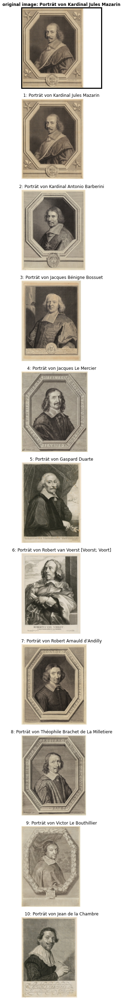

1 :  https://www.graphikportal.org/document/gpo00214864?medium=C4E620EA
2 :  https://www.graphikportal.org/document/gpo00217118?medium=7732157
3 :  https://www.graphikportal.org/document/gpo00223995?medium=28EC218A
4 :  https://www.graphikportal.org/document/gpo00216266?medium=75F2153
5 :  https://www.graphikportal.org/document/gpo00220592?medium=28D32184
6 :  https://www.graphikportal.org/document/gpo00219475?medium=28B72176
7 :  https://www.graphikportal.org/document/gpo00216135?medium=758214C
8 :  https://www.graphikportal.org/document/gpo00217358?medium=76D2157
9 :  https://www.graphikportal.org/document/gpo00216573?medium=755214D
10 :  https://www.graphikportal.org/document/gpo00219819?medium=28C92180


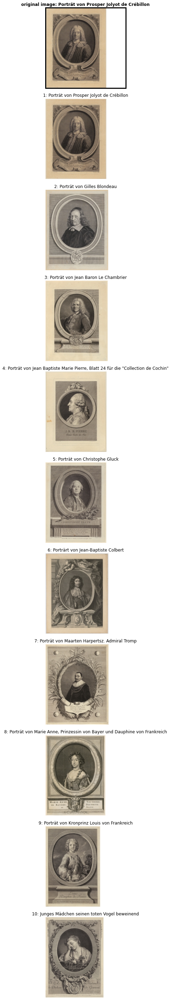

1 :  https://www.graphikportal.org/document/gpo00214913?medium=E5F12114
2 :  https://www.graphikportal.org/document/gpo00215532?medium=752214B
3 :  https://www.graphikportal.org/document/gpo00224535?medium=28DD2184
4 :  https://www.graphikportal.org/document/gpo00221485?medium=28CE217F
5 :  https://www.graphikportal.org/document/gpo00216120?medium=750214A
6 :  https://www.graphikportal.org/document/gpo00215474?medium=7572152
7 :  https://www.graphikportal.org/document/gpo00223592?medium=28EE218B
8 :  https://www.graphikportal.org/document/gpo00217636?medium=781215B
9 :  https://www.graphikportal.org/document/gpo00216273?medium=772215B
10 :  https://www.graphikportal.org/document/gpo00216483?medium=776215A


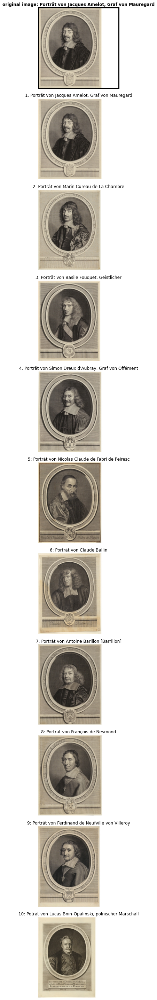

1 :  https://www.graphikportal.org/document/gpo00216062?medium=755214F
2 :  https://www.graphikportal.org/document/gpo00215753?medium=7592150
3 :  https://www.graphikportal.org/document/gpo00217183?medium=7722155
4 :  https://www.graphikportal.org/document/gpo00216849?medium=76A2152
5 :  https://www.graphikportal.org/document/gpo00225311?medium=28DE2182
6 :  https://www.graphikportal.org/document/gpo00221758?medium=28CD217D
7 :  https://www.graphikportal.org/document/gpo00223231?medium=7662151
8 :  https://www.graphikportal.org/document/gpo00215923?medium=7612151
9 :  https://www.graphikportal.org/document/gpo00215214?medium=7512151
10 :  https://www.graphikportal.org/document/gpo00224871?medium=28DB2182


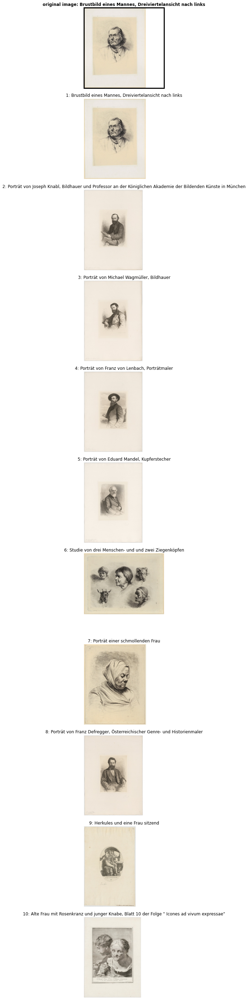

1 :  https://www.graphikportal.org/document/gpo00216210?medium=7642151
2 :  https://www.graphikportal.org/document/gpo00216015?medium=75E214F
3 :  https://www.graphikportal.org/document/gpo00215053?medium=E5FC2118
4 :  https://www.graphikportal.org/document/gpo00215979?medium=7652152
5 :  https://www.graphikportal.org/document/gpo00215074?medium=E60A2120
6 :  https://www.graphikportal.org/document/gpo00217082?medium=77A215C
7 :  https://www.graphikportal.org/document/gpo00215815?medium=7662154
8 :  https://www.graphikportal.org/document/gpo00215871?medium=75F2152
9 :  https://www.graphikportal.org/document/gpo00227577?medium=28D52183
10 :  https://www.graphikportal.org/document/gpo00227488?medium=28D22183


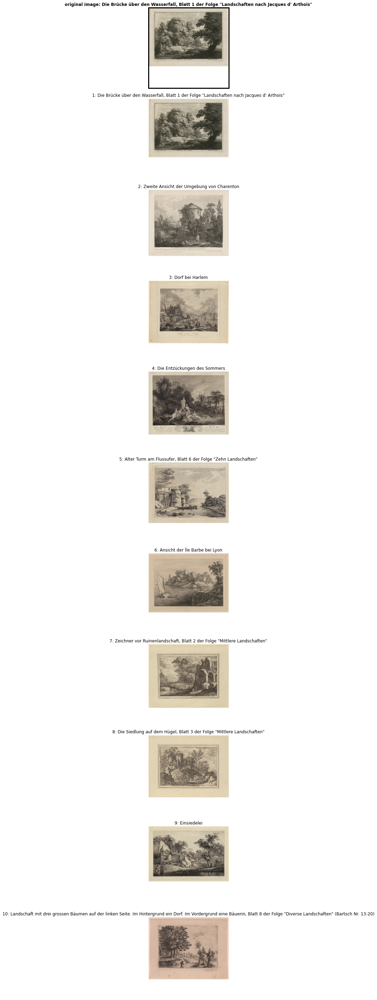

1 :  https://www.graphikportal.org/document/gpo00219134?medium=28B42177
2 :  https://www.graphikportal.org/document/gpo00221911?medium=28CF217D
3 :  https://www.graphikportal.org/document/gpo00224018?medium=28D92183
4 :  https://www.graphikportal.org/document/gpo00217283?medium=7662150
5 :  https://www.graphikportal.org/document/gpo00216848?medium=766214F
6 :  https://www.graphikportal.org/document/gpo00232256?medium=7652151
7 :  https://www.graphikportal.org/document/gpo00224256?medium=28E52188
8 :  https://www.graphikportal.org/document/gpo00223410?medium=28E62188
9 :  https://www.graphikportal.org/document/gpo00223546?medium=28E42184
10 :  https://www.graphikportal.org/document/gpo00217009?medium=7732158


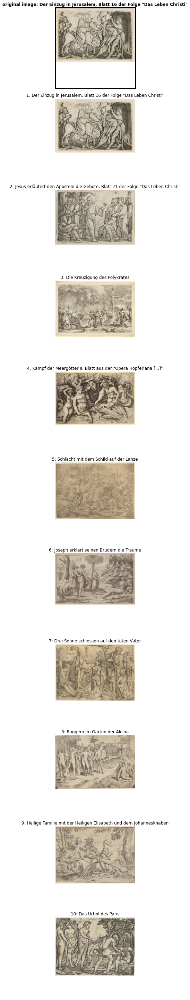

1 :  https://www.graphikportal.org/document/gpo00220727?medium=28B72176
2 :  https://www.graphikportal.org/document/gpo00226022?medium=28BE2179
3 :  https://www.graphikportal.org/document/gpo00215466?medium=74B214A
4 :  https://www.graphikportal.org/document/gpo00222193?medium=28DE2186
5 :  https://www.graphikportal.org/document/gpo00216912?medium=7722156
6 :  https://www.graphikportal.org/document/gpo00232236?medium=28D0217C
7 :  https://www.graphikportal.org/document/gpo00220175?medium=28D22184
8 :  https://www.graphikportal.org/document/gpo00224019?medium=28DA2184
9 :  https://www.graphikportal.org/document/gpo00221513?medium=28CF217F
10 :  https://www.graphikportal.org/document/gpo00226164?medium=28C0217D


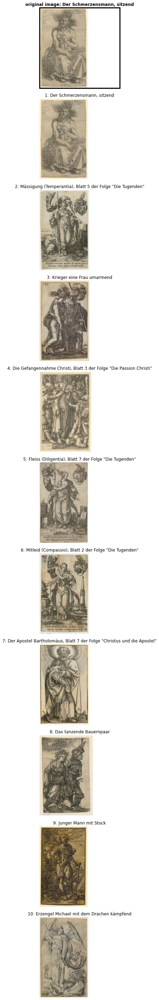

1 :  https://www.graphikportal.org/document/gpo00220805?medium=28C1217D
2 :  https://www.graphikportal.org/document/gpo00222438?medium=28E8218C
3 :  https://www.graphikportal.org/document/gpo00223412?medium=28EA218C
4 :  https://www.graphikportal.org/document/gpo00227132?medium=28D52182
5 :  https://www.graphikportal.org/document/gpo00227005?medium=28D82183
6 :  https://www.graphikportal.org/document/gpo00219563?medium=28B22175
7 :  https://www.graphikportal.org/document/gpo00219058?medium=28CD2180
8 :  https://www.graphikportal.org/document/gpo00219186?medium=28BC217B
9 :  https://www.graphikportal.org/document/gpo00218504?medium=28D72184
10 :  https://www.graphikportal.org/document/gpo00220376?medium=28CA217D


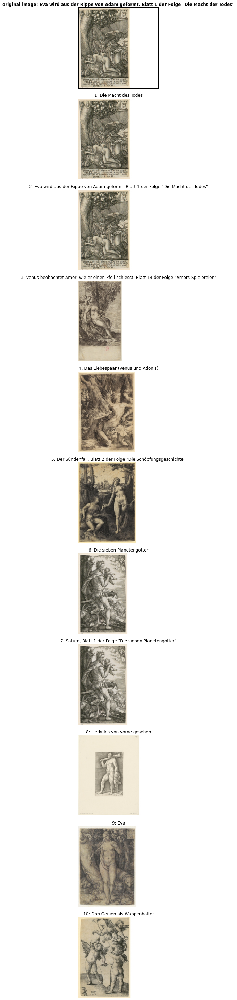

1 :  https://www.graphikportal.org/document/gpo00221597?medium=28C6217D
2 :  https://www.graphikportal.org/document/gpo00222539?medium=28E8218B
3 :  https://www.graphikportal.org/document/gpo00225571?medium=28DF2182
4 :  https://www.graphikportal.org/document/gpo00232275?medium=7652155
5 :  https://www.graphikportal.org/document/gpo00217678?medium=28A52170
6 :  https://www.graphikportal.org/document/gpo00223405?medium=28E12184
7 :  https://www.graphikportal.org/document/gpo00225656?medium=28E82185
8 :  https://www.graphikportal.org/document/gpo00226326?medium=28BE217A
9 :  https://www.graphikportal.org/document/gpo00217567?medium=76C2151
10 :  https://www.graphikportal.org/document/gpo00220410?medium=28D02180


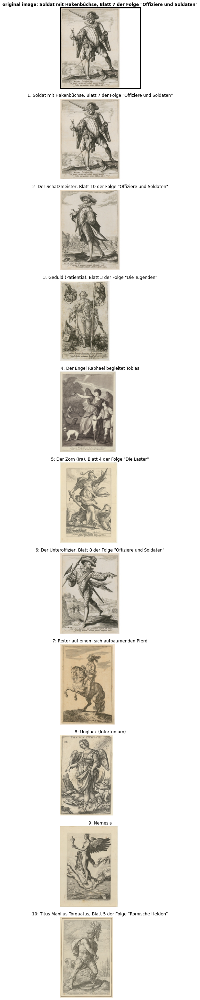

1 :  https://www.graphikportal.org/document/gpo00222833?medium=28D12183
2 :  https://www.graphikportal.org/document/gpo00223529?medium=28E22184
3 :  https://www.graphikportal.org/document/gpo00221281?medium=28D82187
4 :  https://www.graphikportal.org/document/gpo00225162?medium=28DE2182
5 :  https://www.graphikportal.org/document/gpo00226488?medium=28E3218C
6 :  https://www.graphikportal.org/document/gpo00225728?medium=28F2218D
7 :  https://www.graphikportal.org/document/gpo00223985?medium=28E92187
8 :  https://www.graphikportal.org/document/gpo00227057?medium=28E6218C
9 :  https://www.graphikportal.org/document/gpo00226968?medium=28D1217F
10 :  https://www.graphikportal.org/document/gpo00226229?medium=28C6217C


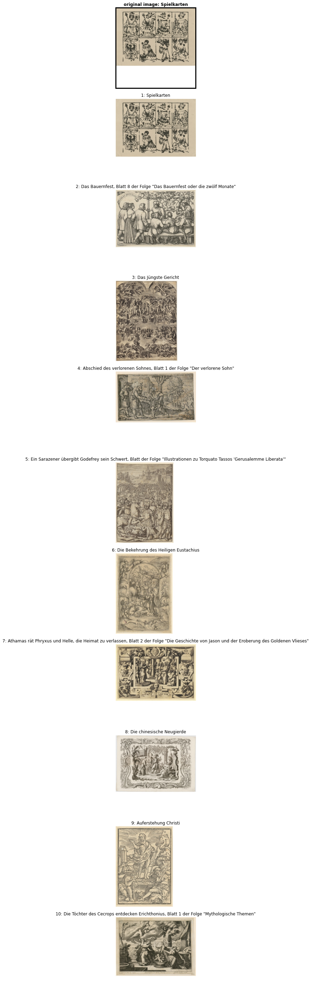

1 :  https://www.graphikportal.org/document/gpo00226354?medium=28CD217E
2 :  https://www.graphikportal.org/document/gpo00227530?medium=28D02180
3 :  https://www.graphikportal.org/document/gpo00216519?medium=75E214F
4 :  https://www.graphikportal.org/document/gpo00222504?medium=28E22188
5 :  https://www.graphikportal.org/document/gpo00217142?medium=77A215A
6 :  https://www.graphikportal.org/document/gpo00217829?medium=28C42180
7 :  https://www.graphikportal.org/document/gpo00218448?medium=28D62187
8 :  https://www.graphikportal.org/document/gpo00227058?medium=28D62183
9 :  https://www.graphikportal.org/document/gpo00227244?medium=28DC2185
10 :  https://www.graphikportal.org/document/gpo00219905?medium=28C82180


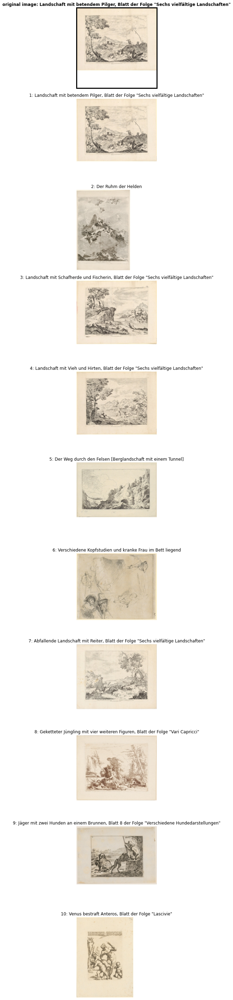

1 :  https://www.graphikportal.org/document/gpo00226378?medium=28E6218A
2 :  https://www.graphikportal.org/document/gpo00215665?medium=7562152
3 :  https://www.graphikportal.org/document/gpo00226366?medium=28E32187
4 :  https://www.graphikportal.org/document/gpo00226373?medium=28E42188
5 :  https://www.graphikportal.org/document/gpo00220929?medium=28CC217C
6 :  https://www.graphikportal.org/document/gpo00222305?medium=28DF2185
7 :  https://www.graphikportal.org/document/gpo00226372?medium=28E52189
8 :  https://www.graphikportal.org/document/gpo00227617?medium=28D72185
9 :  https://www.graphikportal.org/document/gpo00220761?medium=28C3217D
10 :  https://www.graphikportal.org/document/gpo00227189?medium=28C92180


In [34]:
for j in test_ids:
    object_ids, true_metadata = plot_similar_images(j, 
                                                    df, 
                                                    labels, 
                                                    features_list, 
                                                    clf, 
                                                    clf.kneighbors, 
                                                    show_plots=True, 
                                                    save_figures=True)

In [ ]:

# Perform PCA over the features
num_feature_dimensions=100      # Set the number of features
pca = PCA(n_components = num_feature_dimensions)
pca.fit(feature_list)
feature_list_compressed = pca.transform(featureList)

# For speed and clarity, we'll analyze about first half of the dataset.
selected_features = feature_list_compressed[:4000]
selected_class_ids = class_ids[:4000]
selected_filenames = filenames[:4000]

tsne_results =
TSNE(n_components=2,verbose=1,metric='euclidean')
    .fit_transform(selected_features)

# Plot a scatter plot from the generated t-SNE results
colormap = plt.cm.get_cmap('coolwarm')
scatter_plot = plt.scatter(tsne_results[:,0],tsne_results[:,1], c =
               selected_class_ids, cmap=colormap)
plt.colorbar(scatter_plot)
plt.show()